In [1]:
import os
import missingno as msno
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
from sklearn import linear_model
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, roc_auc_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
# importando as bibliotecas dos modelos
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

# Importando os dados

In [2]:
df_train = pd.DataFrame(pd.read_csv('train.csv', encoding='latin1', delimiter=','))
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [3]:
df_test = pd.DataFrame(pd.read_csv('test.csv', encoding='latin1', delimiter=','))
df_test.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 201 entries, ID_code to var_199
dtypes: float64(200), object(1)
memory usage: 306.7+ MB


# Tratamento dos dados

## Distribuição da variável target

In [91]:
# Distribuição da varivél target
df_train['target'].value_counts(normalize=True)

0    0.89951
1    0.10049
Name: target, dtype: float64

## Avaliação dos missings

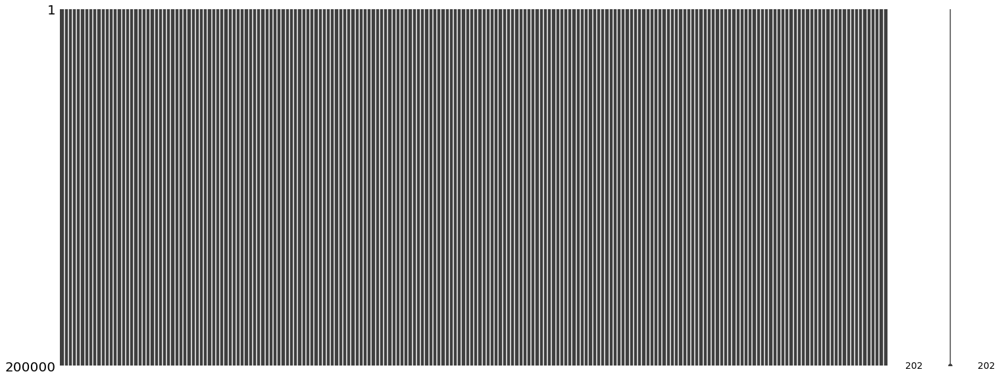

In [6]:
msno.matrix(df_train)

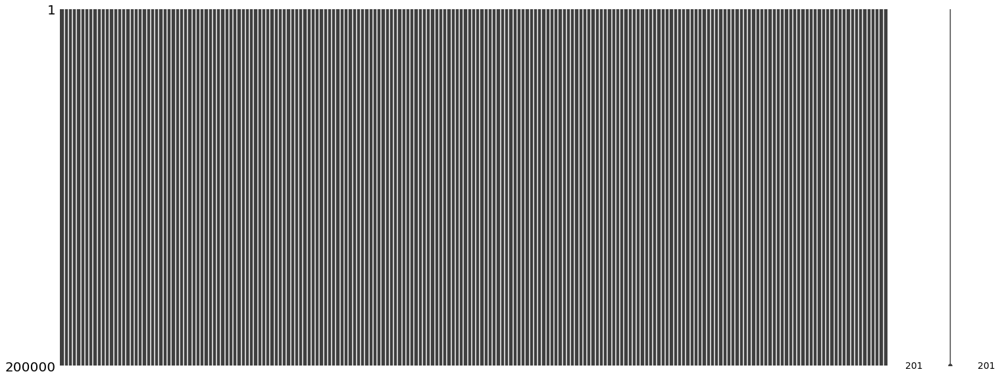

In [7]:
msno.matrix(df_test)

## Análise de duplicadas

In [14]:
# Análise de duplicadas
features = df_train.columns.values[2:202]
unique_max_train = []
unique_max_test = []
for feature in features:
    values = df_train[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])
    values = df_test[feature].value_counts()
    unique_max_test.append([feature, values.max(), values.idxmax()])

In [15]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(15))

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9785,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8632,11.4522


In [16]:
np.transpose((pd.DataFrame(unique_max_test, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(15))

,68,126,108,12,91,103,148,161,25,71,43,166,125,169,133
Feature,var_68,var_126,var_108,var_12,var_91,var_103,var_148,var_161,var_25,var_71,var_43,var_166,var_125,var_169,var_133
Max duplicates,1104,307,302,188,86,78,74,69,60,60,58,53,53,51,50
Value,5.0197,11.5357,14.1999,13.5546,6.9939,1.4659,4.0004,5.7114,13.5965,0.5389,11.5738,2.8446,12.2189,5.8455,6.6873


### As variavéis 68, 126, 108, 12, 91 apresentam os maiores valores de duplicação em todo o dataset

In [18]:
# Reduzindo o consumo de memória pelos datasets
def reduce_mem_usage(df):
    start_mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage of properties dataframe is :",start_mem_usg," MB")
    NAlist = [] # Keeps track of columns that have missing values filled in. 
    for col in df.columns:
        if df[col].dtype != object:  # Exclude strings
                     
            # make variables for Int, max and min
            IsInt = False
            mx = df[col].max()
            mn = df[col].min()
            
            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(df[col]).all(): 
                NAlist.append(col)
                df[col].fillna(mn-1,inplace=True)  
                   
            # test if column can be converted to an integer
            asint = df[col].fillna(0).astype(np.int64)
            result = (df[col] - asint)
            result = result.sum()
            if result > -0.01 and result < 0.01:
                IsInt = True
            
            # Make Integer/unsigned Integer datatypes
            if IsInt:
                if mn >= 0:
                    if mx < 255:
                        df[col] = df[col].astype(np.uint8)
                    elif mx < 65535:
                        df[col] = df[col].astype(np.uint16)
                    elif mx < 4294967295:
                        df[col] = df[col].astype(np.uint32)
                    else:
                        df[col] = df[col].astype(np.uint64)
                else:
                    if mn > np.iinfo(np.int8).min and mx < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif mn > np.iinfo(np.int16).min and mx < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif mn > np.iinfo(np.int32).min and mx < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif mn > np.iinfo(np.int64).min and mx < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)    
            
            # Make float datatypes 32 bit
            else:
                df[col] = df[col].astype(np.float32)
                
    # Print final result
    print("___MEMORY USAGE AFTER COMPLETION:___")
    mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage is: ",mem_usg," MB")
    print("This is ",100*mem_usg/start_mem_usg,"% of the initial size")
    return df, NAlist

In [19]:
reduce_mem_usage(df_train)

Memory usage of properties dataframe is : 308.2276153564453  MB
___MEMORY USAGE AFTER COMPLETION:___
Memory usage is:  154.30458068847656  MB
This is  50.06189354903625 % of the initial size


(             ID_code  target    var_0   var_1      var_2    var_3    var_4  \
 0            train_0       0   8.9255 -6.7863  11.908100   5.0930  11.4607   
 1            train_1       0  11.5006 -4.1473  13.858800   5.3890  12.3622   
 2            train_2       0   8.6093 -2.7457  12.080500   7.8928  10.5825   
 3            train_3       0  11.0604 -2.1518   8.952200   7.1957  12.5846   
 4            train_4       0   9.8369 -1.4834  12.874600   6.6375  12.2772   
 5            train_5       0  11.4763 -2.3182  12.608000   8.6264  10.9621   
 6            train_6       0  11.8091 -0.0832   9.349400   4.2916  11.1355   
 7            train_7       0  13.5580 -7.9881  13.877600   7.5985   8.6543   
 8            train_8       0  16.1071  2.4426  13.930700   5.6327   8.8014   
 9            train_9       0  12.5088  1.9743   8.896000   5.4508  13.6043   
 10          train_10       0   5.0702 -0.5447   9.590000   4.2987  12.3910   
 11          train_11       0  12.7188 -7.9750  10.3

In [20]:
reduce_mem_usage(df_test)

Memory usage of properties dataframe is : 306.7017364501953  MB
___MEMORY USAGE AFTER COMPLETION:___
Memory usage is:  154.1138458251953  MB
This is  50.248768594833685 % of the initial size


(            ID_code      var_0    var_1      var_2    var_3    var_4  \
 0            test_0  11.065600   7.7798  12.953600   9.4292  11.4327   
 1            test_1   8.530400   1.2543  11.304700   5.1858   9.1974   
 2            test_2   5.482700 -10.3581  10.140700   7.0479  10.2628   
 3            test_3   8.537400  -1.3222  12.022000   6.5749   8.8458   
 4            test_4  11.705800  -0.1327  14.129500   7.7506   9.1035   
 5            test_5   5.986200  -2.2913   8.605800   7.0685  14.2465   
 6            test_6   8.462400  -6.1065   7.360300   8.2627  12.0104   
 7            test_7  17.303499  -2.4212  13.398900   8.3998  11.0777   
 8            test_8   6.985600   0.8402  13.716100   4.7749   8.6784   
 9            test_9  10.381100  -6.9348  14.669000   9.0941  11.9058   
 10          test_10   8.343100  -4.1427   9.198500   9.8229  11.2494   
 11          test_11  10.613700  -2.1898   8.909000   3.8014  13.8602   
 12          test_12  12.746500  -4.9467  15.549000

## Avaliação da distribuição inter quartil

In [23]:
# Analise do describe
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
target,200000.0,0.100490,0.300653,0.000000,0.000000,0.00000,0.000000,1.000000
var_0,200000.0,10.679973,3.039990,0.408400,8.453850,10.52475,12.758200,20.315001
var_1,200000.0,-1.627628,4.049967,-15.043400,-4.740025,-1.60805,1.358625,10.376800
var_2,200000.0,10.715126,2.640832,2.117100,8.722475,10.58000,12.516700,19.353001
var_3,200000.0,6.796523,2.043276,-0.040200,5.254075,6.82500,8.324100,13.188300
var_4,200000.0,11.078255,1.623114,5.074800,9.883175,11.10825,12.261125,16.671400
var_5,200000.0,-5.065340,7.863115,-32.562599,-11.200350,-4.83315,0.924800,17.251600
var_6,200000.0,5.408961,0.866585,2.347300,4.767700,5.38510,6.003000,8.447700
var_7,200000.0,16.545988,3.418009,5.349700,13.943800,16.45680,19.102900,27.691799
var_8,200000.0,0.284159,3.332576,-10.505500,-2.317800,0.39370,2.937900,10.151300


In [24]:
# Analise do describe
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
var_0,200000.0,10.658732,3.036675,0.188700,8.442975,10.513800,12.739600,22.323400
var_1,200000.0,-1.624240,4.040431,-15.043400,-4.700125,-1.590500,1.343400,9.385100
var_2,200000.0,10.707497,2.633820,2.355200,8.735600,10.560700,12.495025,18.714100
var_3,200000.0,6.788238,2.052685,-0.022400,5.230500,6.822350,8.327600,13.142000
var_4,200000.0,11.076387,1.616426,5.484400,9.891075,11.099750,12.253400,16.037100
var_5,200000.0,-5.050552,7.869115,-27.767000,-11.201400,-4.834100,0.942575,17.253700
var_6,200000.0,5.415207,0.864669,2.216400,4.772600,5.391600,6.005800,8.302500
var_7,200000.0,16.529312,3.424418,5.713700,13.933900,16.422700,19.094550,28.292801
var_8,200000.0,0.277133,3.333328,-9.956000,-2.303900,0.372000,2.930025,9.665500
var_9,200000.0,7.569351,1.231836,4.243300,6.623800,7.632000,8.584825,11.003600


# Estabelecendo o modelo baseline - Logistica "Plain Vanilla"
## Com todas as features e sem ajuste de hiperparâmetros

In [25]:
# instanciando, rodando e imprimindo os resultados da regressão logistica
X, y = df_train.drop(['ID_code','target'],axis=1), df_train['target']
clf = LogisticRegression(random_state=0, n_jobs = -1).fit(X, y)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:1296: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


In [26]:
# fazendo predições com o último modelo de regressão logística ajustado
y_predict = clf.predict(df_train.drop(['ID_code','target'],axis=1))

## Média da quantidade de clientes que transaciona com o banco

In [27]:
# calculando a média dos valores de transação
df_train.target.mean()

0.10049

## Média da quantidade de clientes que transaciona com o banco estimada pelo modelo

In [28]:
# calculando a média dos valores preditos para comparação
y_predict.mean()

0.03924

### Coeficiente de correlação entre os casos preditos e reais

In [29]:
# calculando a correlacao entre os valores reais e preditos
np.corrcoef(df_train.target,y_predict)[0][1]

0.3967668801599658

In [30]:
# definindo valores booleanos para y_predict de acordo com a sua média
for i in range(0,len(y_predict),1):
    if y_predict[i] < y_predict.mean(): #treshold do modelo
        y_predict[i] = 0
    else:
        y_predict[i] = 1

## Matriz de confusão do Sklearn e Curva ROC

[[177475   2427]
 [ 14677   5421]]


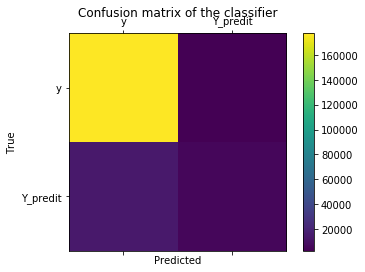

In [31]:
# calculando os resultados da matriz de confusão

labels = ['y', 'Y_predit']
cm = confusion_matrix(df_train.target, y_predict)
print(cm)
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


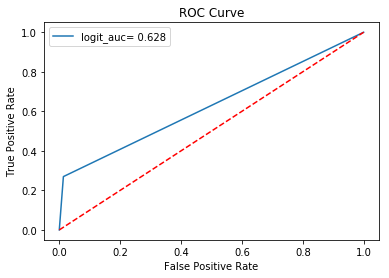

In [32]:
# plotando uma curva ROC e calculando a AUC
# utilizando os valores da série y original e os valores probabilísticos de resultado

fpr,tpr,thresholds = roc_curve(df_train.target.values,clf.predict((df_train.drop(['ID_code','target'],axis=1))))

logit_auc = roc_auc_score(df_train.target.values,clf.predict((df_train.drop(['ID_code','target'],axis=1))))

plt.plot(fpr,tpr,label='logit_auc= %0.3f'%logit_auc)
plt.plot([0,1],[0,1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')

# Tratamento do dataset

## Balanceamento do dataset

In [4]:
# Class count
count_class_0, count_class_1 = df_train.target.value_counts()

# Divide by class
df_class_0 = df_train[df_train['target'] == 0]
df_class_1 = df_train[df_train['target'] == 1]

Random over-sampling:
1    179902
0    179902
Name: target, dtype: int64


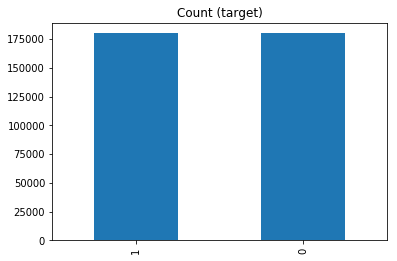

In [5]:
df_class_1_over = df_class_1.sample(count_class_0, replace=True)
df_train_r = pd.concat([df_class_0, df_class_1_over], axis=0)

print('Random over-sampling:')
print(df_train_r.target.value_counts())

df_train_r.target.value_counts().plot(kind='bar', title='Count (target)');

In [93]:
df_train_r.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359804 entries, 0 to 94623
Columns: 202 entries, ID_code to var_199
dtypes: float32(200), object(1), uint8(1)
memory usage: 280.3+ MB


In [94]:
df_train_r.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.522699,-2.3978,7.8784,8.5635,12.780300,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.430500,2.0339,8.1267,8.7889,18.356001,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.604200,3.1417,-6.5213,8.2675,14.722200,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.034700,-1.2706,-2.9275,10.2922,17.969700,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.287600,-1.5121,3.9267,9.5031,17.997400,-8.8104


## Vizualização da correlação entre as variavéis no data set

In [18]:
# Divisão de uma amostra dos dados em 40/60
X, y = df_train_r.sample(frac=0.1, replace=True, random_state=123).drop(['ID_code','target'],axis=1), df_train_r.sample(frac=0.1, replace=True, random_state=123)['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0, stratify=y)

In [15]:
from yellowbrick.features import Rank2D

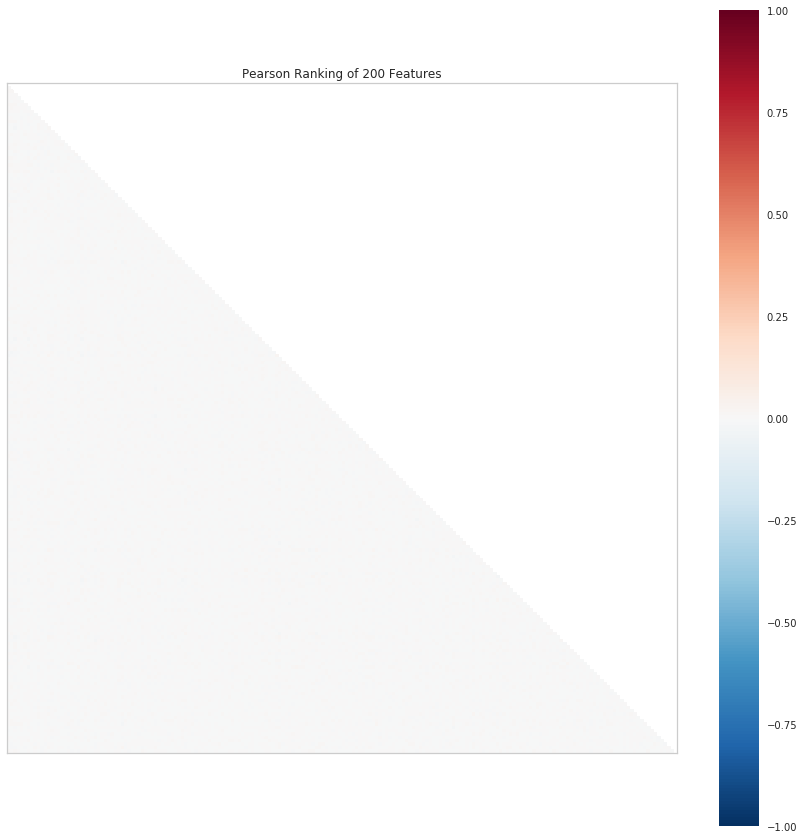

In [15]:
visualizer = Rank2D(algorithm="pearson",  show_feature_names=False, size=(1080, 1080))
visualizer.fit_transform(X_train)
visualizer.poof()

# Visualizando precision, recall, F1 por modelo para seleção de variavéis

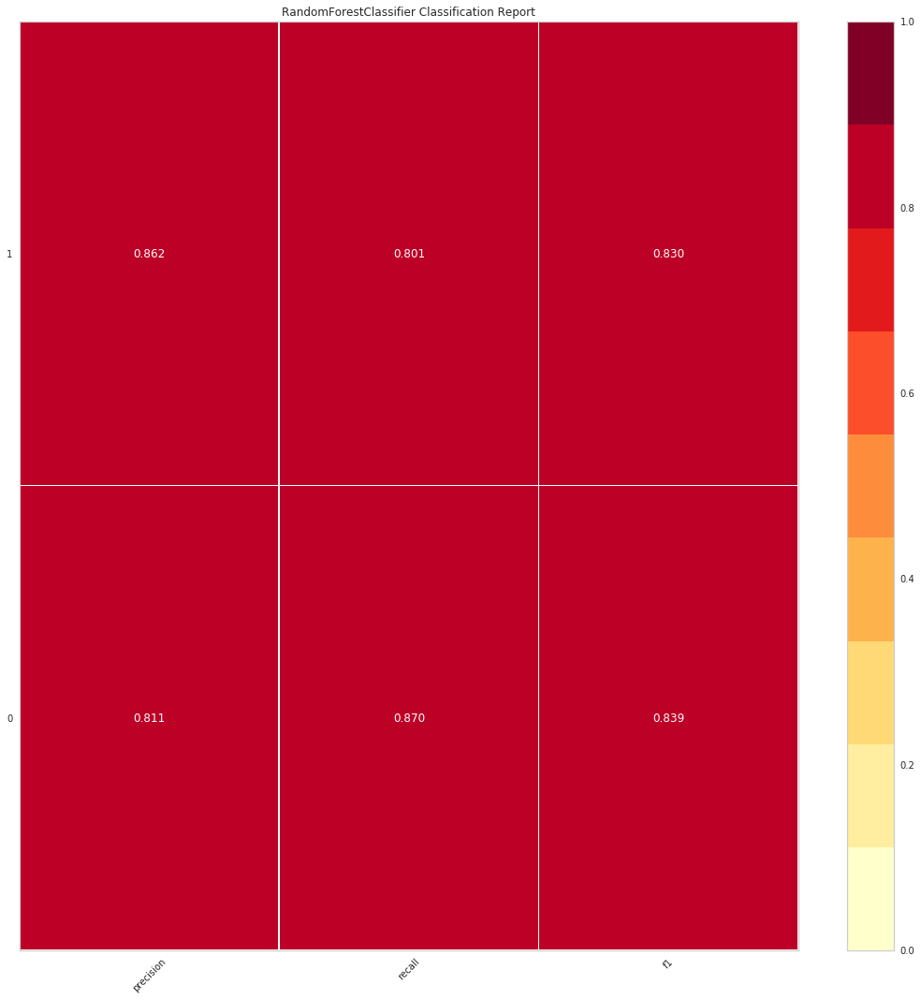

In [19]:
from yellowbrick.classifier import ClassificationReport
from sklearn.ensemble import RandomForestClassifier
model =  RandomForestClassifier(n_estimators=500, criterion='gini', random_state=0, n_jobs=1)
visualizer = ClassificationReport(model, size=(1080, 1080))
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


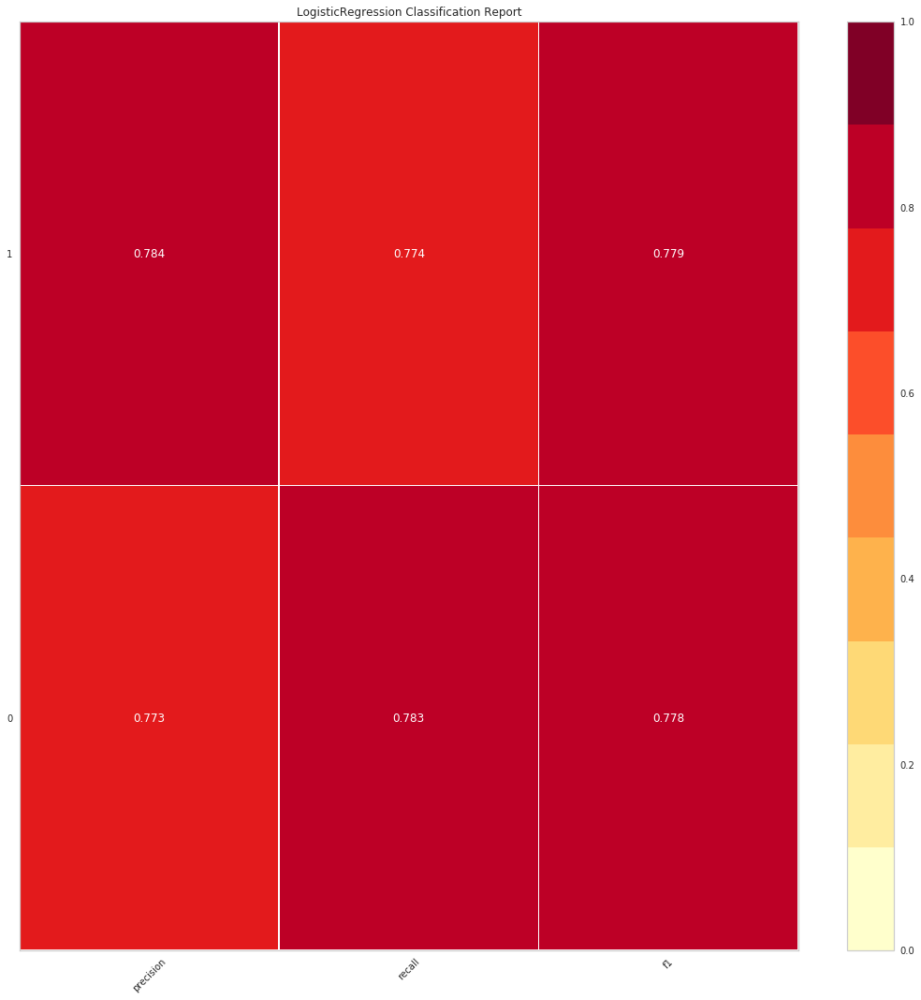

In [20]:
model = LogisticRegression(penalty="l1")
visualizer = ClassificationReport(model, size=(1080, 1080))
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

# Seleção de variavéis por Random Forest

In [37]:
# Split the data into 40% test and 60% training
X, y = df_train_r.drop(['ID_code','target'],axis=1), df_train_r['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0, stratify=y)

In [38]:
# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=500, criterion='gini', random_state=0, n_jobs=-1)

In [39]:
# Train the classifier
clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [40]:
# Create a list of feature names
feat_labels = list(X_train.columns.values)

In [41]:
# Print the name and gini importance of each feature
for feature in zip(feat_labels, clf.feature_importances_):
    print(feature)

('var_0', 0.006945604351423421)
('var_1', 0.006295437738395205)
('var_2', 0.0075185779746937)
('var_3', 0.0037952418927124426)
('var_4', 0.0037558942065748033)
('var_5', 0.004575865703716754)
('var_6', 0.01018085765378332)
('var_7', 0.003814867414396205)
('var_8', 0.004008736768192885)
('var_9', 0.005693490186728233)
('var_10', 0.0037462447069876647)
('var_11', 0.004102624990512541)
('var_12', 0.012475571679532156)
('var_13', 0.007028360878498274)
('var_14', 0.003860937805756679)
('var_15', 0.0038849665824702596)
('var_16', 0.003806180219237281)
('var_17', 0.00380597028804128)
('var_18', 0.0053029565866700296)
('var_19', 0.0038247974750522137)
('var_20', 0.00393940845391504)
('var_21', 0.007607991187777356)
('var_22', 0.009069684067535267)
('var_23', 0.004181493857690689)
('var_24', 0.004274037327574111)
('var_25', 0.0038254349833329137)
('var_26', 0.010605478534493836)
('var_27', 0.003760968771012442)
('var_28', 0.004055025485864477)
('var_29', 0.003785766759970151)
('var_30', 0.00380

In [42]:
from sklearn.feature_selection import SelectFromModel

In [43]:
# Create a selector object that will use the random forest classifier to identify
sfm = SelectFromModel(clf)

In [44]:
# Train the selector
sfm.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=False, random_state=0, verbose=0, warm_start=False),
        max_features=None, norm_order=1, prefit=False, threshold=None)

In [45]:
# Print the names of the most important features
for feature_list_index in sfm.get_support(indices=True):
    print(feat_labels[feature_list_index])

var_0
var_1
var_2
var_6
var_9
var_12
var_13
var_18
var_21
var_22
var_26
var_33
var_34
var_40
var_44
var_53
var_67
var_76
var_78
var_80
var_81
var_91
var_92
var_94
var_95
var_99
var_108
var_109
var_110
var_115
var_121
var_122
var_123
var_133
var_139
var_146
var_147
var_148
var_149
var_154
var_164
var_165
var_166
var_169
var_170
var_173
var_174
var_177
var_179
var_184
var_190
var_191
var_192
var_198


In [46]:
# Transform the data to create a new dataset containing only the most important features
# Note: We have to apply the transform to both the training X and test X data.
X_important_train = sfm.transform(X_train)
X_important_test = sfm.transform(X_test)

In [47]:
# Create a new random forest classifier for the most important features
clf_important = RandomForestClassifier(n_estimators=500, random_state=0, n_jobs=-1)

In [48]:
# Train the new classifier on the new dataset containing the most important features
clf_important.fit(X_important_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [49]:
# Apply The Full Featured Classifier To The Test Data
y_pred = clf.predict(X_test)

In [50]:
y_test.shape, y_pred.shape

((143922,), (143922,))

### Acurácia do modelo com todas as variáveis

In [51]:
# View The Accuracy Of Our Full Feature Model
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.997998916079543

### Acurácia do modelo com 54 variavéis selecionadas

In [52]:
# Apply The Full Featured Classifier To The Test Data
y_important_pred = clf_important.predict(X_important_test)

# View The Accuracy Of Our Limited Feature (2 Features) Model
accuracy_score(y_test, y_important_pred)

0.9971581829046289

# Análise das distribuições das features mais importantes

In [6]:
#selecionar as melhores features
df_train1 = pd.DataFrame(df_train_r[["ID_code", "target" , "var_0", "var_1", "var_2", "var_6", "var_9", "var_12", "var_13", "var_18",
                                   "var_21", "var_22", "var_26", "var_33", "var_34", "var_40", "var_44", "var_53", "var_67",
                                   "var_76", "var_78", "var_80", "var_81", "var_91", "var_92", "var_94", "var_95", "var_99",
                                   "var_107", "var_108", "var_109", "var_110", "var_115", "var_121", "var_122", "var_123", 
                                   "var_133", "var_139", "var_146", "var_148", "var_149", "var_154", "var_164", "var_165",
                                   "var_166", "var_169", "var_170", "var_173", "var_174", "var_177", "var_179", "var_184", 
                                   "var_190", "var_191", "var_192", "var_198"]])

In [7]:
df_train1.head()

,ID_code,target,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,...,var_170,var_173,var_174,var_177,var_179,var_184,var_190,var_191,var_192,var_198
0,train_0,0,8.9255,-6.7863,11.9081,5.1187,5.7470,14.0137,0.5745,4.2840,...,-4.7645,3.1531,18.5618,13.7241,1.7202,25.8398,4.4354,3.9642,3.1364,12.7803
1,train_1,0,11.5006,-4.1473,13.8588,5.6208,8.0851,14.0239,8.4135,7.8000,...,5.5378,5.5134,30.2645,16.5721,11.0752,22.5441,7.6421,7.7214,2.5837,18.3560
2,train_2,0,8.6093,-2.7457,12.0805,6.9427,5.9525,14.1929,7.3124,4.7011,...,-7.0927,-5.8234,25.6820,8.8438,2.4013,23.0866,2.9057,9.7905,1.6704,14.7222
3,train_3,0,11.0604,-2.1518,8.9522,5.8428,8.2450,13.8463,11.9704,15.9426,...,-7.1541,11.7134,14.7483,13.9552,5.6961,-0.4639,4.4666,4.7433,0.7178,17.9697
4,train_4,0,9.8369,-1.4834,12.8746,5.9405,7.6784,13.8481,7.8895,6.5263,...,1.4493,2.3705,18.4685,13.5261,5.1743,11.8503,-1.4905,9.5214,-0.1508,17.9974


In [55]:
df_train1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359804 entries, 0 to 86587
Data columns (total 56 columns):
ID_code    359804 non-null object
target     359804 non-null uint8
var_0      359804 non-null float32
var_1      359804 non-null float32
var_2      359804 non-null float32
var_6      359804 non-null float32
var_9      359804 non-null float32
var_12     359804 non-null float32
var_13     359804 non-null float32
var_18     359804 non-null float32
var_21     359804 non-null float32
var_22     359804 non-null float32
var_26     359804 non-null float32
var_33     359804 non-null float32
var_34     359804 non-null float32
var_40     359804 non-null float32
var_44     359804 non-null float32
var_53     359804 non-null float32
var_67     359804 non-null float32
var_76     359804 non-null float32
var_78     359804 non-null float32
var_80     359804 non-null float32
var_81     359804 non-null float32
var_91     359804 non-null float32
var_92     359804 non-null float32
var_94     359804 

In [27]:
df_train1.shape

(359804, 56)

In [43]:
df_test1 =   pd.DataFrame(df_test[["ID_code", "var_0", "var_1", "var_2", "var_6", "var_9", "var_12", "var_13", "var_18",
                                   "var_21", "var_22", "var_26", "var_33", "var_34", "var_40", "var_44", "var_53", "var_67",
                                   "var_76", "var_78", "var_80", "var_81", "var_91", "var_92", "var_94", "var_95", "var_99",
                                   "var_107", "var_108", "var_109", "var_110", "var_115", "var_121", "var_122", "var_123", 
                                   "var_133", "var_139", "var_146", "var_148", "var_149", "var_154", "var_164", "var_165",
                                   "var_166", "var_169", "var_170", "var_173", "var_174", "var_177", "var_179", "var_184", 
                                   "var_190", "var_191", "var_192", "var_198"]])

In [44]:
df_test1.head()

,ID_code,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,var_21,...,var_170,var_173,var_174,var_177,var_179,var_184,var_190,var_191,var_192,var_198
0,test_0,11.0656,7.7798,12.9536,5.8493,8.8100,13.9696,0.3458,15.5806,18.8064,...,4.2603,8.4685,18.1317,10.2226,2.2926,31.3521,-2.1556,11.8495,-1.4300,15.4722
1,test_1,8.5304,1.2543,11.3047,6.0196,5.9739,14.1129,2.5667,29.1609,3.1389,...,-0.7720,-5.6274,10.5018,8.1696,5.2110,25.1958,10.6165,8.8349,0.9403,19.1293
2,test_2,5.4827,-10.3581,10.1407,4.8950,8.3442,13.6751,3.8183,21.2181,12.3696,...,-0.0391,-2.9787,27.4035,15.6415,4.4611,24.4721,-0.7484,10.9935,1.9803,19.8956
3,test_3,8.5374,-1.3222,12.0220,4.9397,7.4578,14.0526,13.5010,2.1273,12.5527,...,7.2048,11.1674,14.5499,13.9407,1.1019,8.1154,9.5702,9.0766,1.6580,13.0168
4,test_4,11.7058,-0.1327,14.1295,6.8595,7.1437,14.1013,8.9672,18.0126,16.3059,...,-1.6039,2.3640,14.0037,10.1161,6.0889,3.9829,4.2259,9.1723,1.2835,13.9260


In [59]:
df_test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 55 columns):
ID_code    200000 non-null object
var_0      200000 non-null float32
var_1      200000 non-null float32
var_2      200000 non-null float32
var_6      200000 non-null float32
var_9      200000 non-null float32
var_12     200000 non-null float32
var_13     200000 non-null float32
var_18     200000 non-null float32
var_21     200000 non-null float32
var_22     200000 non-null float32
var_26     200000 non-null float32
var_33     200000 non-null float32
var_34     200000 non-null float32
var_40     200000 non-null float32
var_44     200000 non-null float32
var_53     200000 non-null float32
var_67     200000 non-null float32
var_76     200000 non-null float32
var_78     200000 non-null float32
var_80     200000 non-null float32
var_81     200000 non-null float32
var_91     200000 non-null float32
var_92     200000 non-null float32
var_94     200000 non-null float32
var_95     2000

In [26]:
df_test1.shape

(200000, 55)

## Distribuição das varivéis

In [73]:
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(3,2,figsize=(18,22))

    for feature in features:
        i += 1
        plt.subplot(3,2,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=9)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
        plt.tick_params(axis='y', which='major', labelsize=6)
    plt.show();

In [62]:
t0 = df_train1.loc[df_train1['target'] == 0]
t1 = df_train1.loc[df_train1['target'] == 1]

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

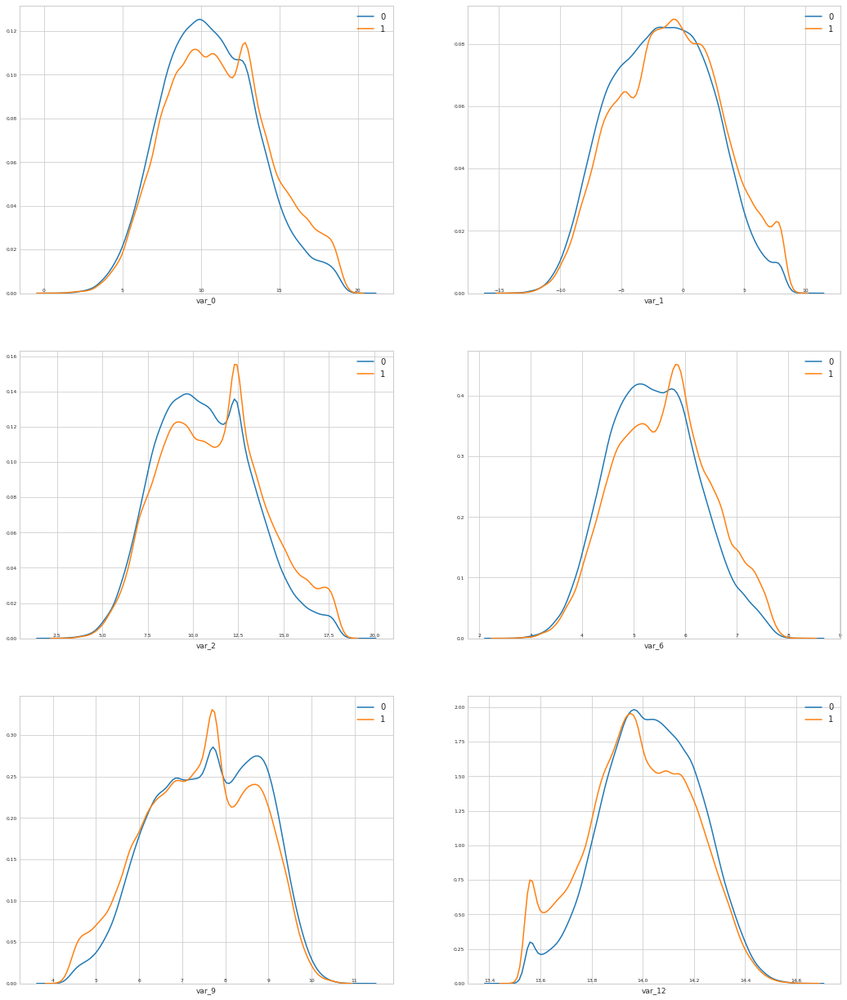

In [63]:
features = df_train1.columns.values[2:8]
plot_feature_distribution(t0, t1, '0', '1', features);

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

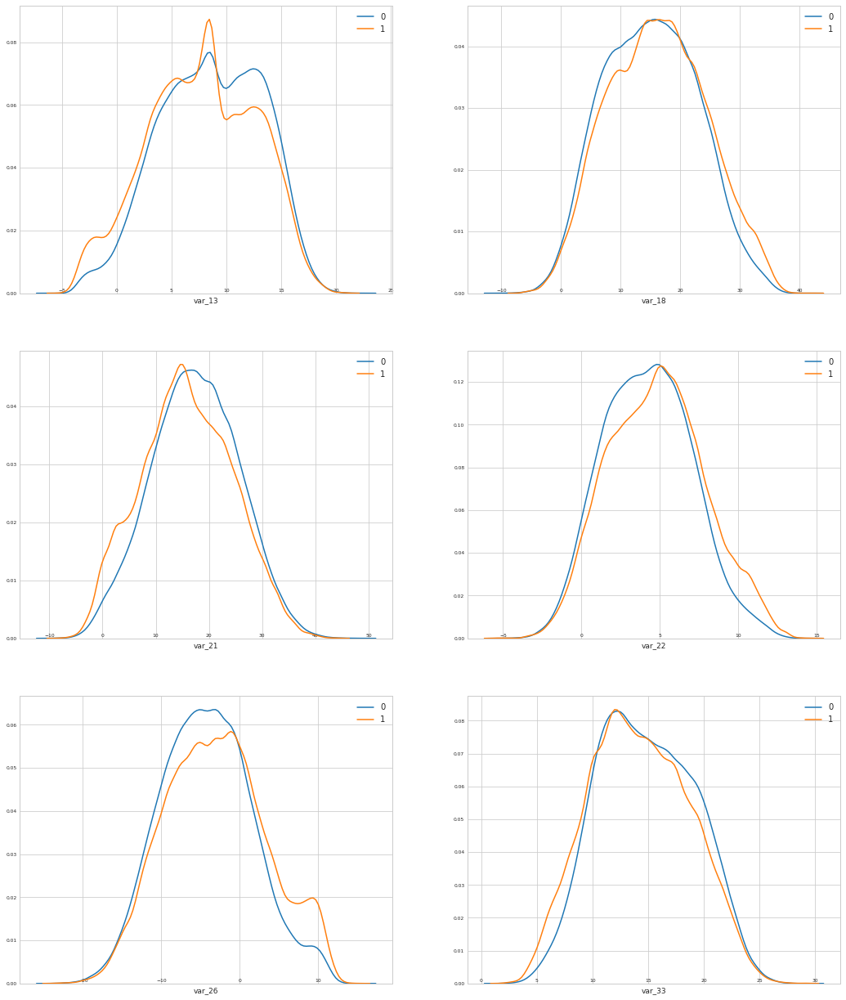

In [64]:
features = df_train1.columns.values[8:14]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

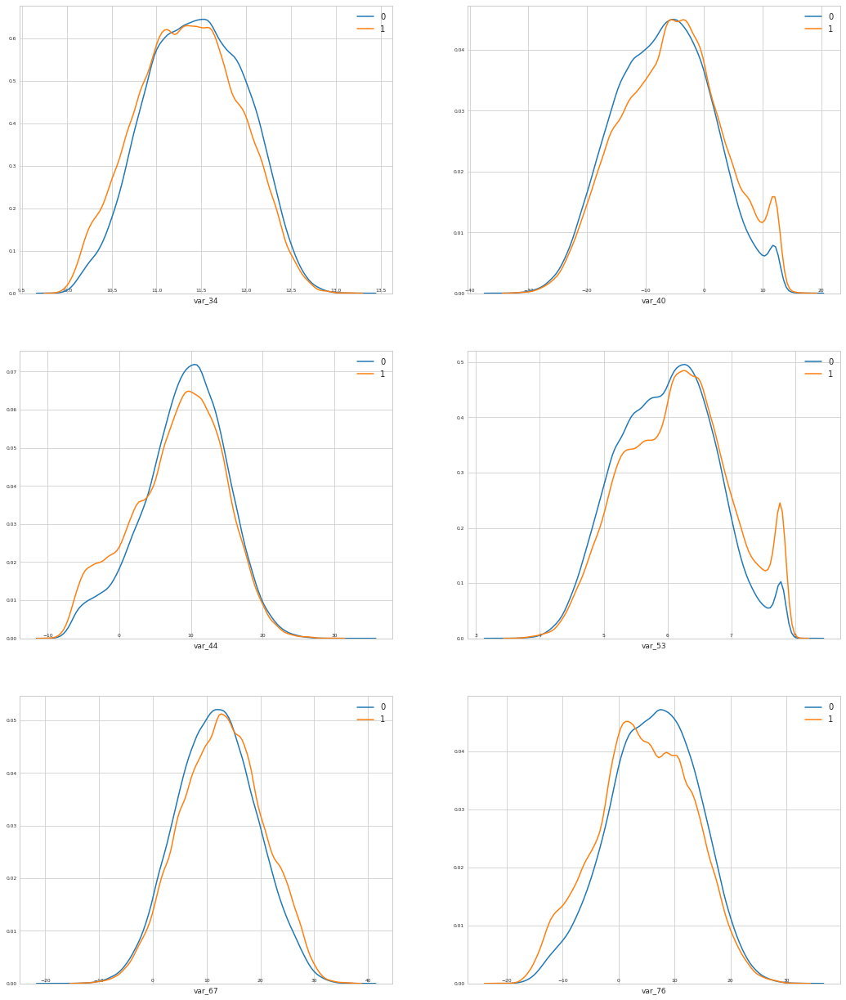

In [65]:
features = df_train1.columns.values[14:20]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

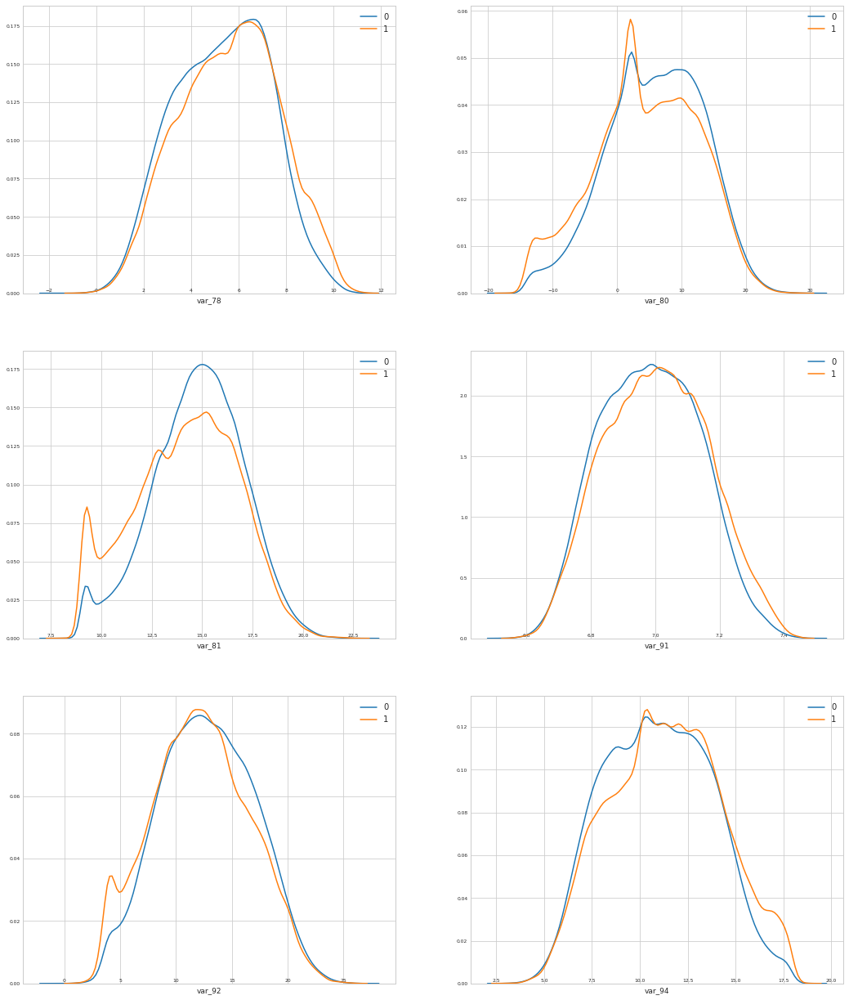

In [66]:
features = df_train1.columns.values[20:26]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

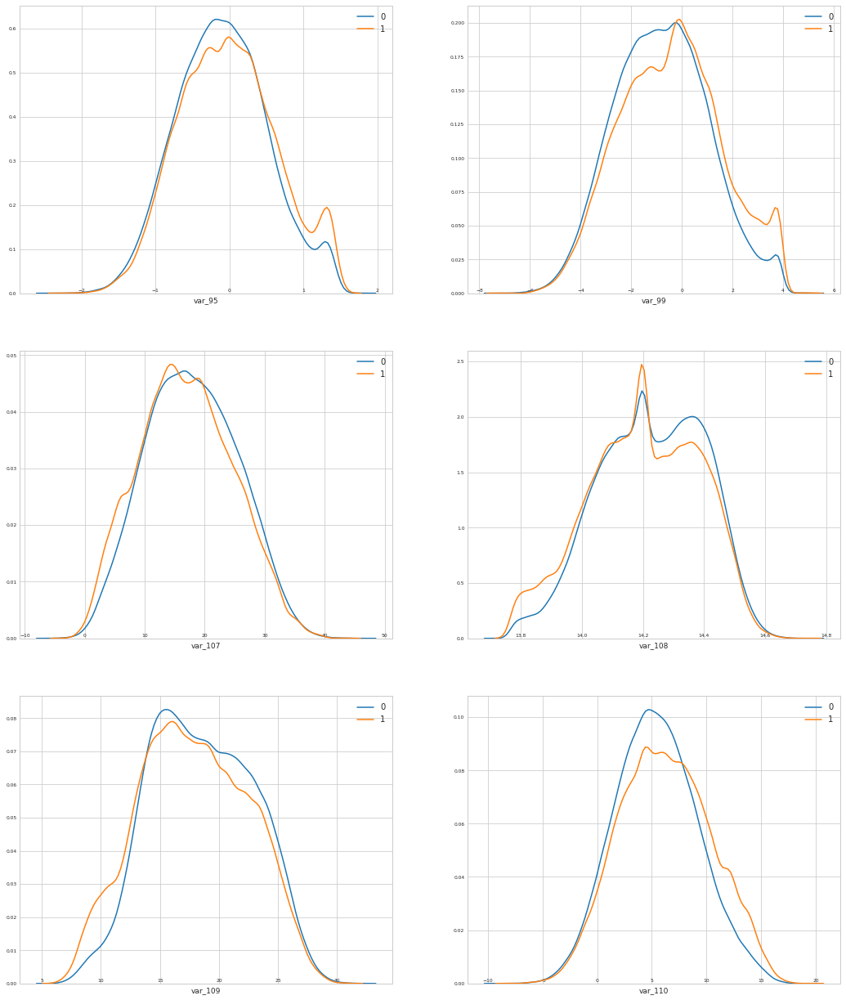

In [67]:
features = df_train1.columns.values[26:32]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

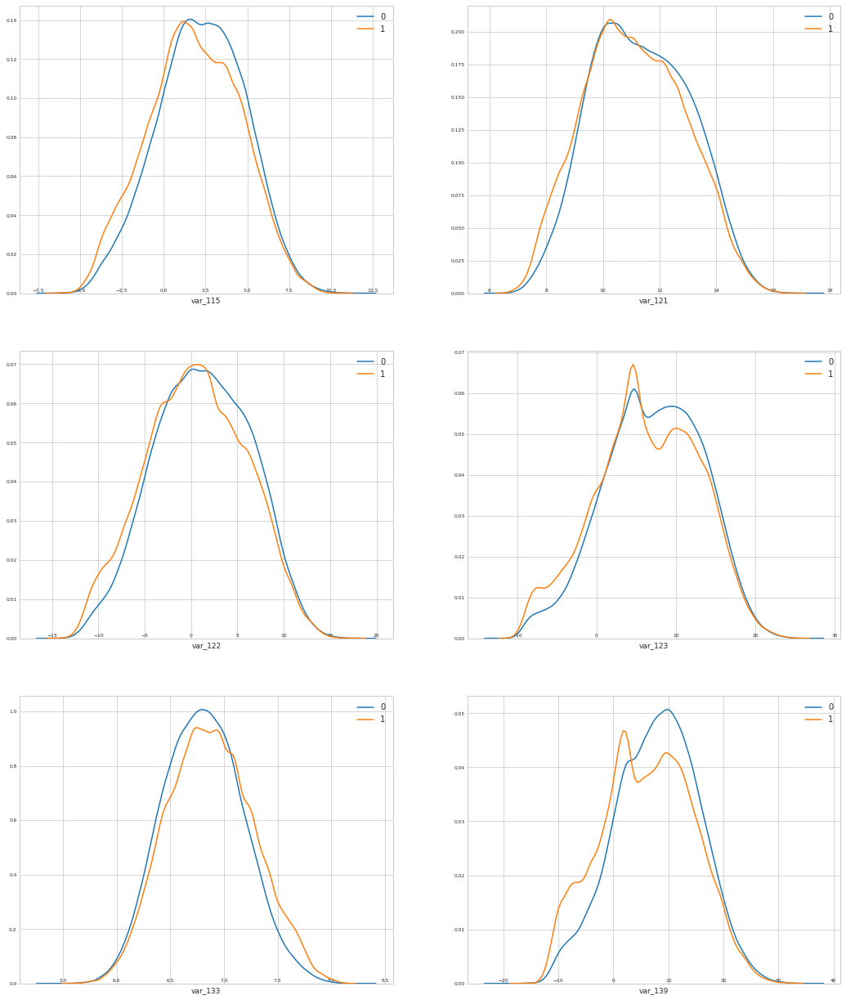

In [68]:
features = df_train1.columns.values[32:38]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

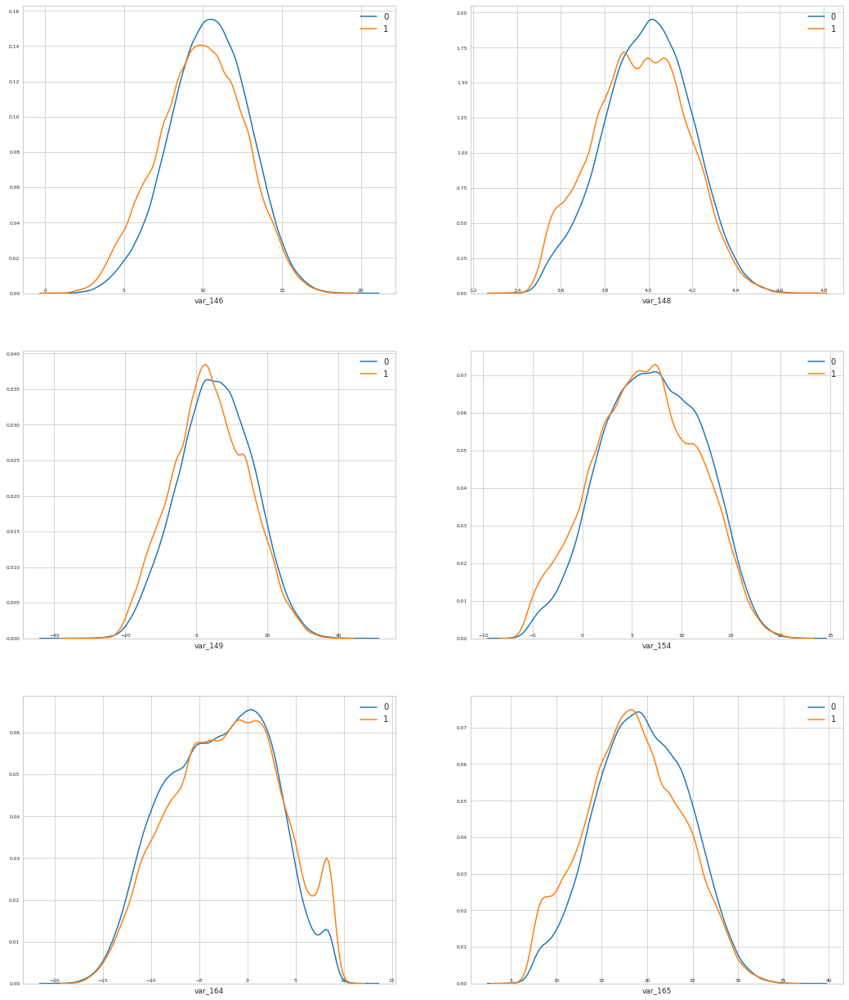

In [69]:
features = df_train1.columns.values[38:44]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

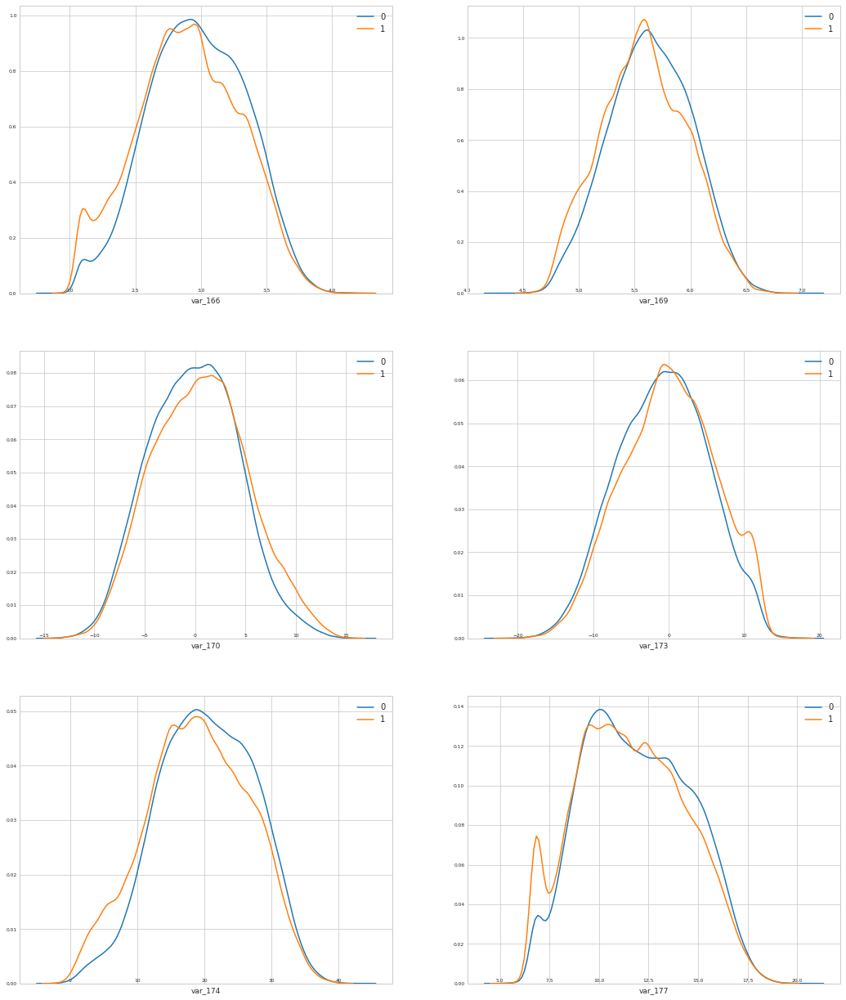

In [70]:
features = df_train1.columns.values[44:50]
plot_feature_distribution(t0, t1, '0', '1', features)

/home/ec2-user/anaconda3/envs/amazonei_mxnet_p36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 432x288 with 0 Axes>

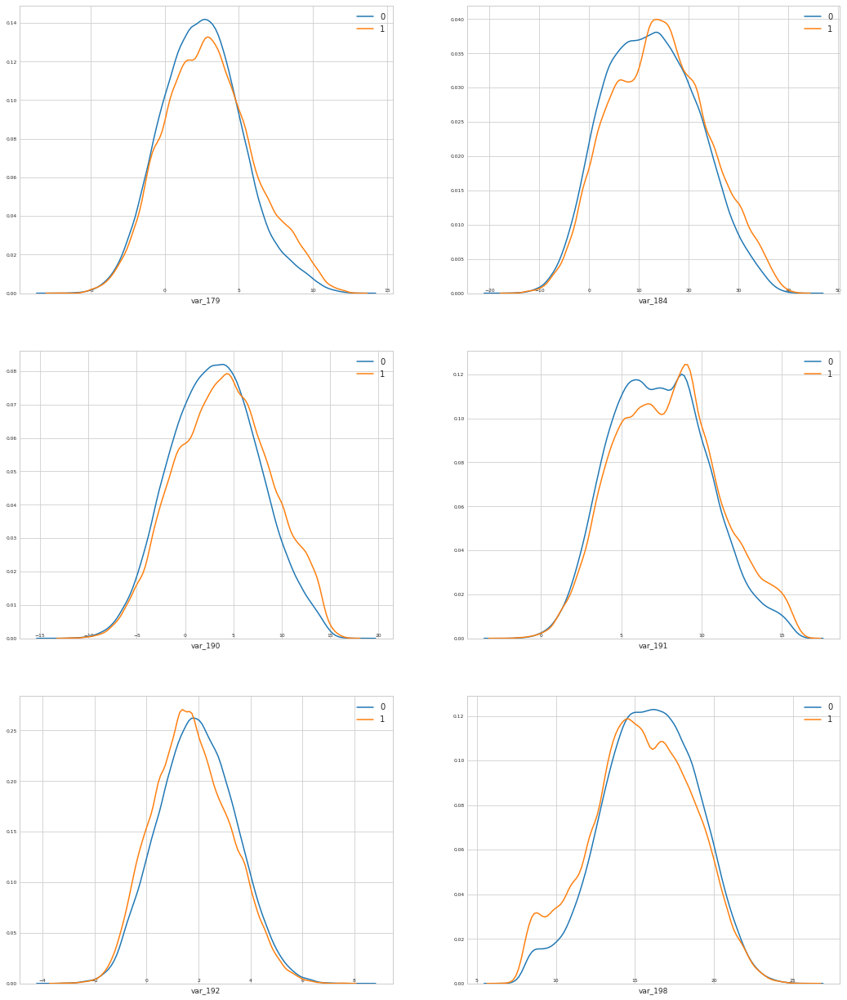

In [71]:
features = df_train1.columns.values[50:56]
plot_feature_distribution(t0, t1, '0', '1', features)

# Análise do pairplot das varivéis

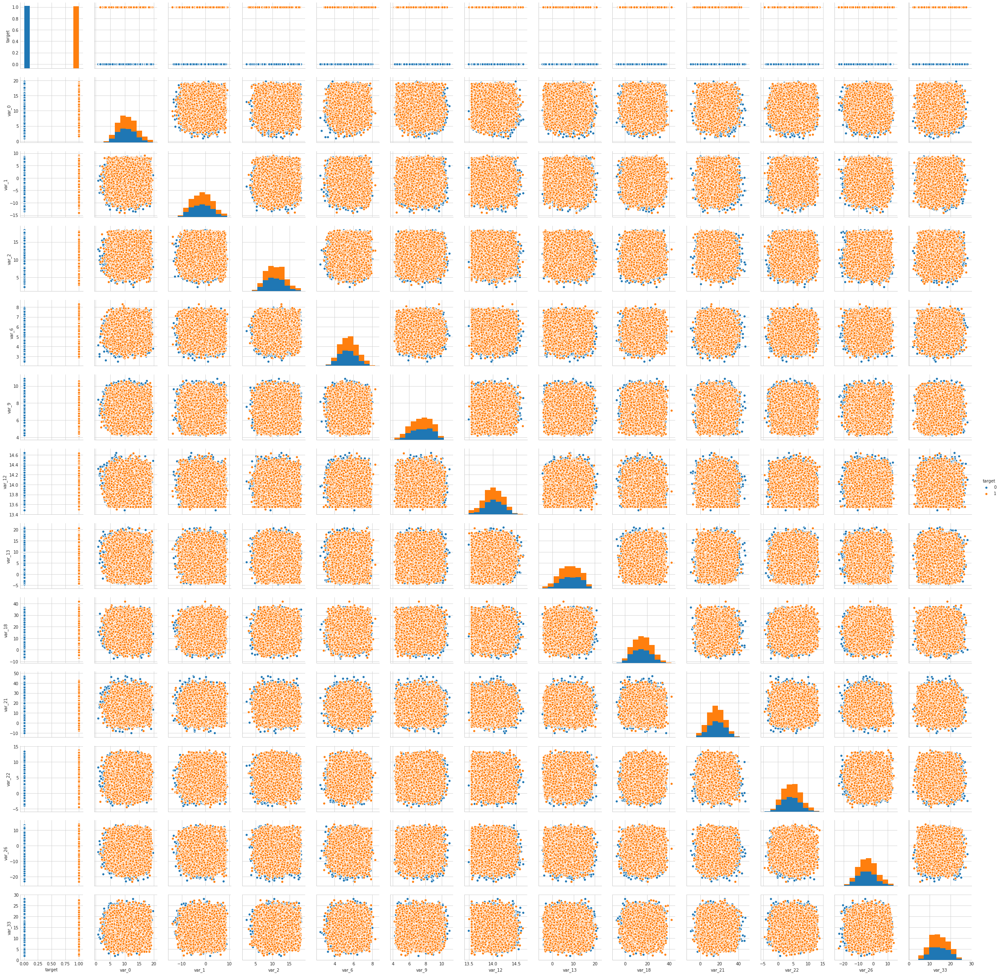

In [72]:
sns.pairplot(df_train1.sample(frac=0.1,random_state=123),
             vars=["target", "var_0","var_1","var_2","var_6","var_9","var_12","var_13","var_18","var_21","var_22","var_26","var_33"],
             hue="target");

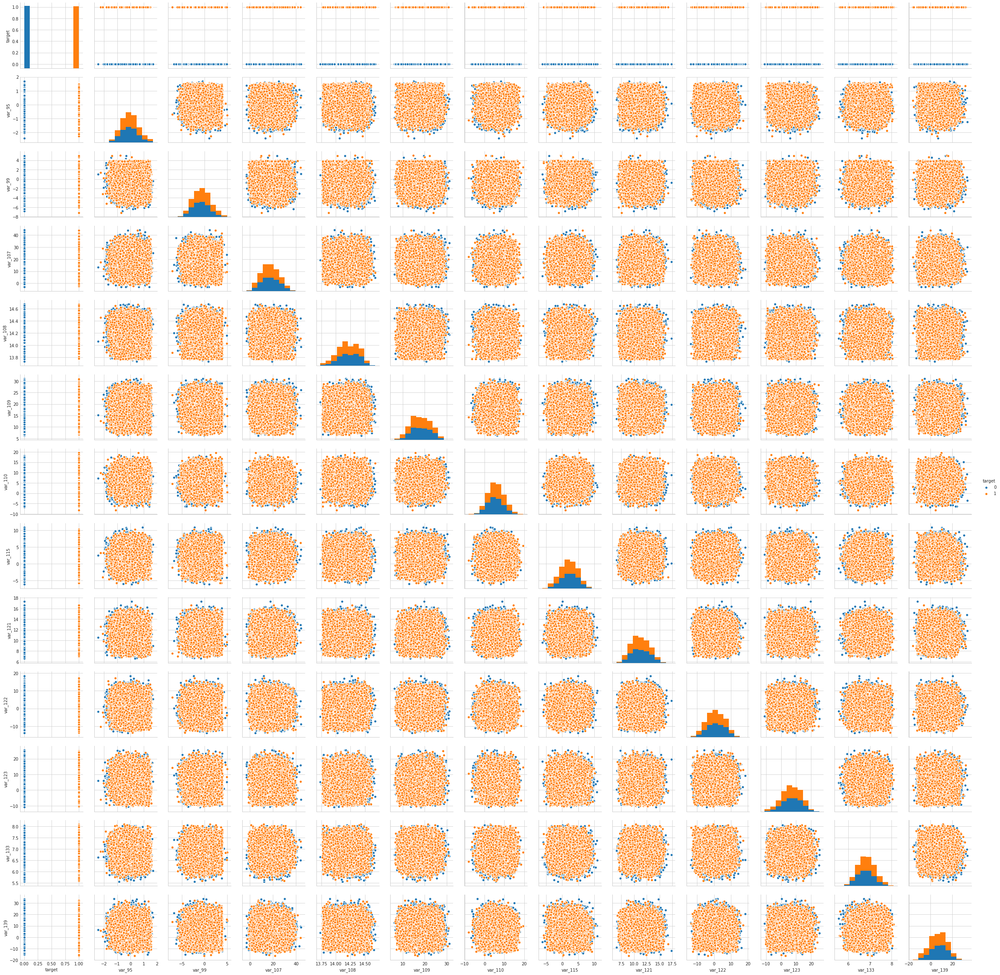

In [73]:
sns.pairplot(df_train1.sample(frac=0.1,random_state=123),
             vars=["target", "var_95","var_99","var_107","var_108","var_109","var_110","var_115","var_121","var_122","var_123","var_133","var_139"],
             hue="target");

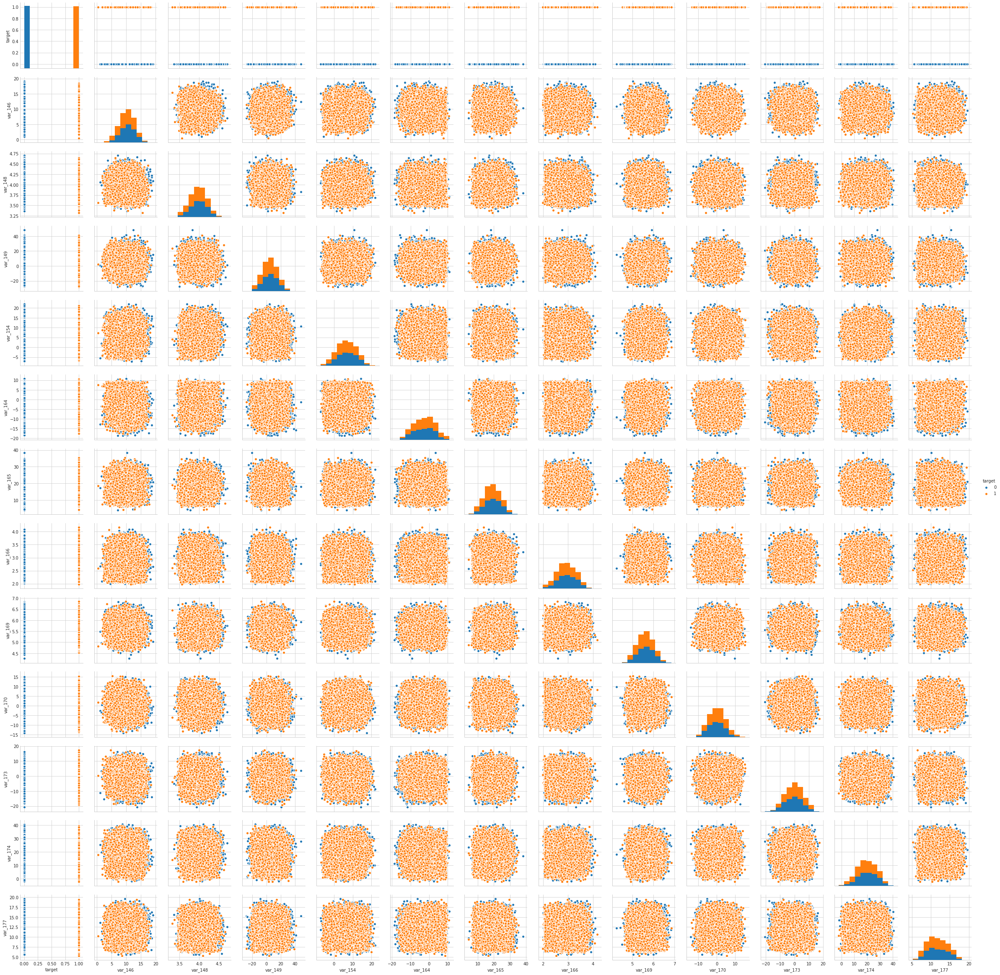

In [74]:
sns.pairplot(df_train1.sample(frac=0.1,random_state=123),
             vars=["target", "var_146","var_148","var_149","var_154","var_164","var_165","var_166","var_169","var_170","var_173","var_174","var_177"],
             hue="target");

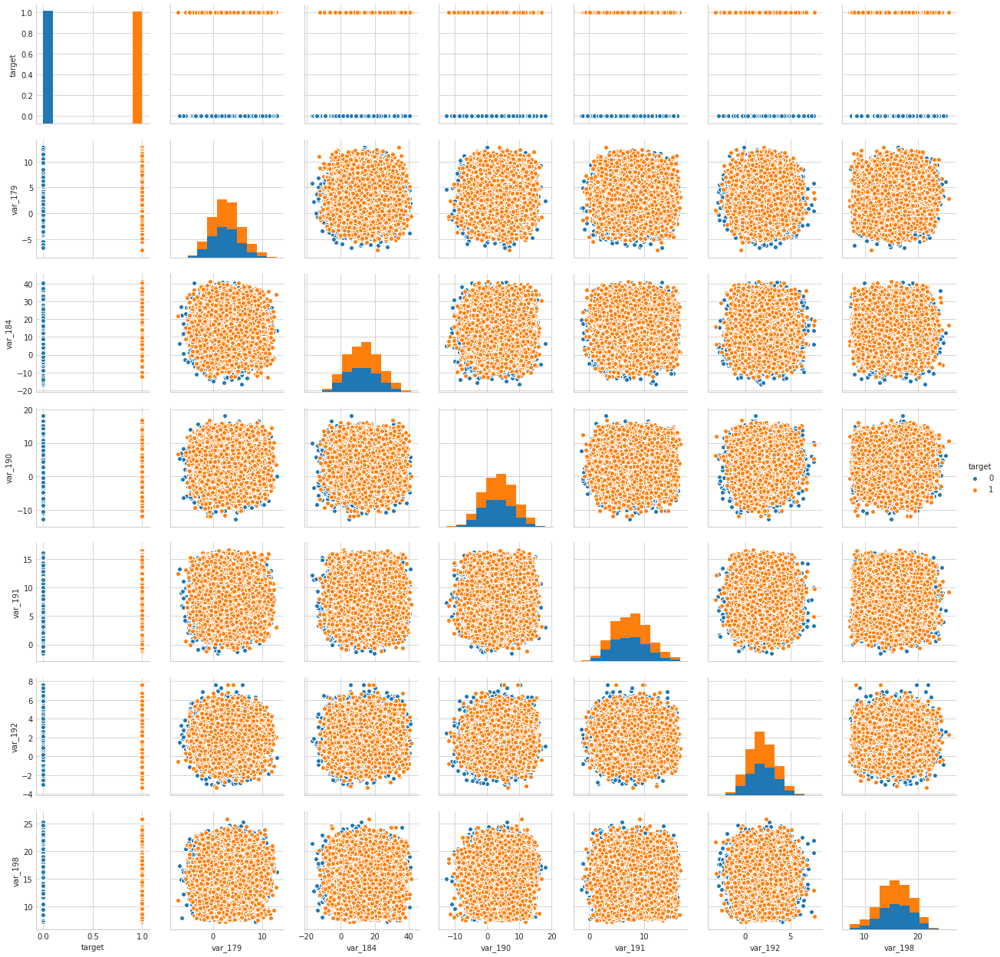

In [75]:
sns.pairplot(df_train1.sample(frac=0.1,random_state=123),
             vars=["target", "var_179","var_184","var_190","var_191","var_192","var_198"],
             hue="target");

# Analise das distâncias inter quantis

In [76]:
#analisar o describe
df_train1.describe().T

,count,mean,std,min,25%,50%,75%,max
target,359804.0,0.500000,0.500001,0.000000,0.000000,0.500000,1.000000,1.000000
var_0,359804.0,10.890084,3.150865,0.408400,8.556000,10.723300,13.011825,20.315001
var_1,359804.0,-1.362515,4.141615,-15.043400,-4.535600,-1.341100,1.656100,10.376800
var_2,359804.0,10.906742,2.743106,2.117100,8.814800,10.784350,12.739500,19.353001
var_6,359804.0,5.485901,0.895742,2.347300,4.817400,5.476200,6.098900,8.447700
var_9,359804.0,7.495492,1.256644,3.970500,6.547600,7.564400,8.520000,11.150600
var_12,359804.0,14.006214,0.199182,13.434600,13.872300,14.007300,14.154700,14.654500
var_13,359804.0,8.179607,4.766057,-6.011100,4.678700,8.280000,12.024400,22.331499
var_18,359804.0,15.695652,8.009370,-10.664200,9.546600,15.644050,21.520325,41.748001
var_21,359804.0,16.618860,8.388399,-10.089000,10.786300,16.514000,22.641325,49.044300


# Análise das correlações

In [30]:
# Split the data into 40% test and 60% training
X, y = df_train1.drop(['ID_code','target'],axis=1), df_train1['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0, stratify=y)

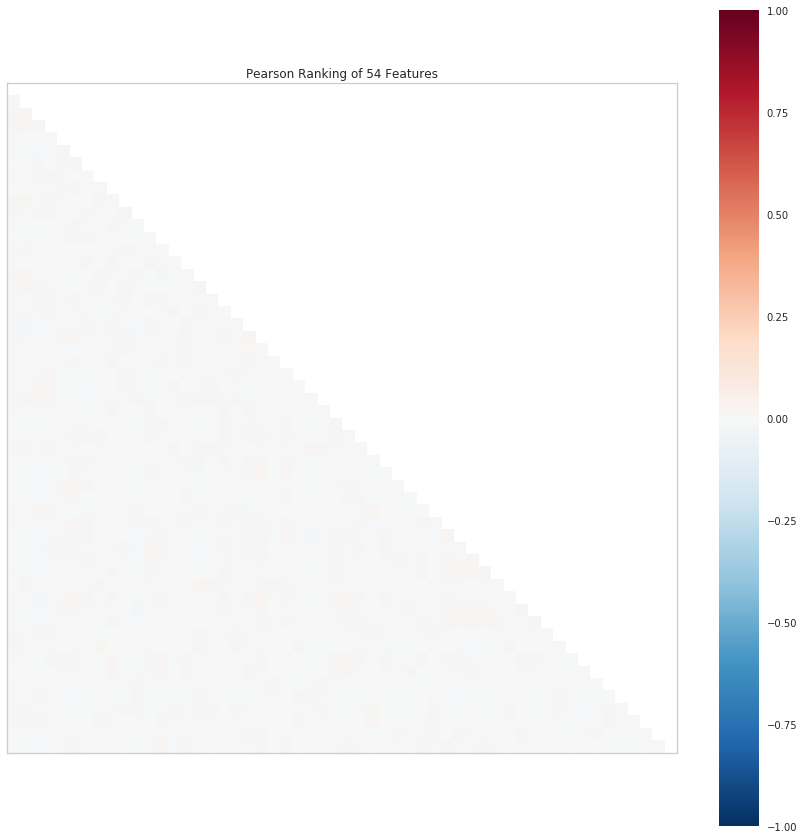

In [31]:
#analisar o heatmap
visualizer = Rank2D(algorithm="pearson",  show_feature_names=False, size=(1080, 1080))
visualizer.fit_transform(X_train)
visualizer.poof()

# Correção das distribuições via log normal

In [ ]:
#df_train1.drop(df_train1.loc[:, 'logtarget': ].columns, axis = 1, inplace = True) 
#df_train1.shape

In [10]:
for c in [c for c in df_train1.columns.drop(['ID_code', 'target']) if np.issubdtype(df_train1[c].dtype , np.number)]:
    df_train1["log_" + c] = np.log1p(df_train1[c])

In [11]:
df_train1.head()

,ID_code,target,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,...,log_var_170,log_var_173,log_var_174,log_var_177,log_var_179,log_var_184,log_var_190,log_var_191,log_var_192,log_var_198
0,train_0,0,8.9255,-6.7863,11.9081,5.1187,5.7470,14.0137,0.5745,4.2840,...,NaN,1.423855,2.973579,2.689486,1.000705,3.289886,1.692933,1.602252,1.419826,2.623240
1,train_1,0,11.5006,-4.1473,13.8588,5.6208,8.0851,14.0239,8.4135,7.8000,...,1.877601,1.873862,3.442483,2.866312,2.491154,3.158875,2.156646,2.165780,1.276396,2.963002
2,train_2,0,8.6093,-2.7457,12.0805,6.9427,5.9525,14.1929,7.3124,4.7011,...,NaN,NaN,3.283989,2.286842,1.224158,3.181656,1.362437,2.378666,0.982228,2.755074
3,train_3,0,11.0604,-2.1518,8.9522,5.8428,8.2450,13.8463,11.9704,15.9426,...,NaN,2.542657,2.756732,2.705059,1.901525,-0.623435,1.698657,1.748034,0.541044,2.942843
4,train_4,0,9.8369,-1.4834,12.8746,5.9405,7.6784,13.8481,7.8895,6.5263,...,0.895802,1.215061,2.968798,2.675947,1.820396,2.553367,NaN,2.353411,-0.163461,2.944302


In [12]:
df_train2=df_train1.drop(df_train1.loc[: ,'var_0':'var_198'].columns, axis = 1) 
df_train2.head()

,ID_code,target,log_var_0,log_var_1,log_var_2,log_var_6,log_var_9,log_var_12,log_var_13,log_var_18,...,log_var_170,log_var_173,log_var_174,log_var_177,log_var_179,log_var_184,log_var_190,log_var_191,log_var_192,log_var_198
0,train_0,0,2.295107,NaN,2.557855,1.811350,1.909098,2.708963,0.453938,1.664683,...,NaN,1.423855,2.973579,2.689486,1.000705,3.289886,1.692933,1.602252,1.419826,2.623240
1,train_1,0,2.525777,NaN,2.698592,1.890216,2.206636,2.709642,2.242145,2.174752,...,1.877601,1.873862,3.442483,2.866312,2.491154,3.158875,2.156646,2.165780,1.276396,2.963002
2,train_2,0,2.262731,NaN,2.571123,2.072253,1.939101,2.720828,2.117748,1.740659,...,NaN,NaN,3.283989,2.286842,1.224158,3.181656,1.362437,2.378666,0.982228,2.755074
3,train_3,0,2.489927,NaN,2.297794,1.923197,2.224083,2.697751,2.562670,2.829831,...,NaN,2.542657,2.756732,2.705059,1.901525,-0.623435,1.698657,1.748034,0.541044,2.942843
4,train_4,0,2.382957,NaN,2.630060,1.937374,2.160837,2.697872,2.184871,2.018404,...,0.895802,1.215061,2.968798,2.675947,1.820396,2.553367,NaN,2.353411,-0.163461,2.944302


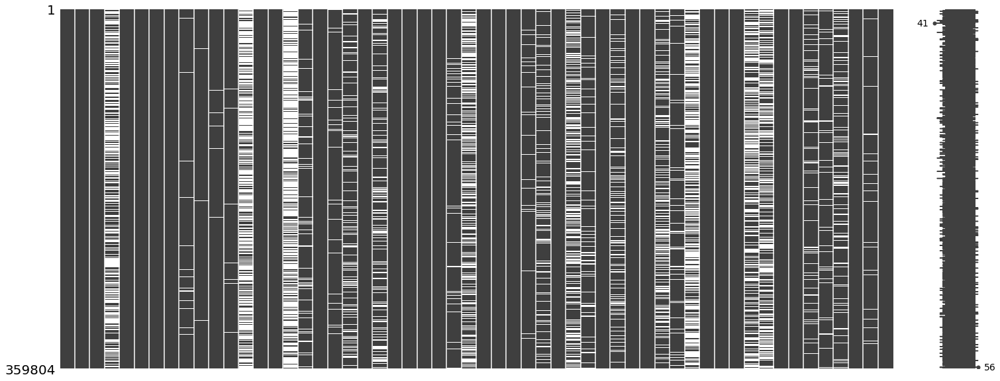

In [18]:
msno.matrix(df_train2)

In [23]:
df_train1.drop(df_train1.loc[:, 'log_var_0': ].columns, axis = 1, inplace = True) 
df_train1.head()

,ID_code,target,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,...,var_170,var_173,var_174,var_177,var_179,var_184,var_190,var_191,var_192,var_198
0,train_0,0,8.9255,-6.7863,11.9081,5.1187,5.7470,14.0137,0.5745,4.2840,...,-4.7645,3.1531,18.5618,13.7241,1.7202,25.8398,4.4354,3.9642,3.1364,12.7803
1,train_1,0,11.5006,-4.1473,13.8588,5.6208,8.0851,14.0239,8.4135,7.8000,...,5.5378,5.5134,30.2645,16.5721,11.0752,22.5441,7.6421,7.7214,2.5837,18.3560
2,train_2,0,8.6093,-2.7457,12.0805,6.9427,5.9525,14.1929,7.3124,4.7011,...,-7.0927,-5.8234,25.6820,8.8438,2.4013,23.0866,2.9057,9.7905,1.6704,14.7222
3,train_3,0,11.0604,-2.1518,8.9522,5.8428,8.2450,13.8463,11.9704,15.9426,...,-7.1541,11.7134,14.7483,13.9552,5.6961,-0.4639,4.4666,4.7433,0.7178,17.9697
4,train_4,0,9.8369,-1.4834,12.8746,5.9405,7.6784,13.8481,7.8895,6.5263,...,1.4493,2.3705,18.4685,13.5261,5.1743,11.8503,-1.4905,9.5214,-0.1508,17.9974


In [13]:
for c in [c for c in df_test1.columns.drop(['ID_code']) if np.issubdtype(df_test1[c].dtype , np.number)]:
    df_test1["log_" + c] = np.log1p(df_test1[c])

In [14]:
df_test1.head()

,ID_code,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,var_21,...,log_var_170,log_var_173,log_var_174,log_var_177,log_var_179,log_var_184,log_var_190,log_var_191,log_var_192,log_var_198
0,test_0,11.0656,7.7798,12.9536,5.8493,8.8100,13.9696,0.3458,15.5806,18.8064,...,1.660188,2.247970,2.951347,2.417930,1.191678,3.476679,NaN,2.553305,NaN,2.801674
1,test_1,8.5304,1.2543,11.3047,6.0196,5.9739,14.1129,2.5667,29.1609,3.1389,...,-1.478410,NaN,2.442504,2.215894,1.826322,3.265599,2.452427,2.285937,0.662843,3.002176
2,test_2,5.4827,-10.3581,10.1407,4.8950,8.3442,13.6751,3.8183,21.2181,12.3696,...,-0.039885,NaN,3.346512,2.811900,1.697650,3.237584,-1.379915,2.484365,1.092024,3.039539
3,test_3,8.5374,-1.3222,12.0220,4.9397,7.4578,14.0526,13.5010,2.1273,12.5527,...,2.104719,2.498760,2.744054,2.704089,0.742842,2.209965,2.358039,2.310216,0.977574,2.640257
4,test_4,11.7058,-0.1327,14.1295,6.8595,7.1437,14.1013,8.9672,18.0126,16.3059,...,NaN,1.213131,2.708297,2.408395,1.958530,1.606012,1.653627,2.319668,0.825709,2.703105


In [15]:
df_test2=df_test1.drop(df_test1.loc[: ,'var_0':'var_198'].columns, axis = 1) 
df_test2.head()

,ID_code,log_var_0,log_var_1,log_var_2,log_var_6,log_var_9,log_var_12,log_var_13,log_var_18,log_var_21,...,log_var_170,log_var_173,log_var_174,log_var_177,log_var_179,log_var_184,log_var_190,log_var_191,log_var_192,log_var_198
0,test_0,2.490358,2.172454,2.635738,1.924146,2.283402,2.706021,0.296989,2.808233,2.986005,...,1.660188,2.247970,2.951347,2.417930,1.191678,3.476679,NaN,2.553305,NaN,2.801674
1,test_1,2.254487,0.812840,2.509981,1.948706,1.942175,2.715549,1.271641,3.406546,1.420430,...,-1.478410,NaN,2.442504,2.215894,1.826322,3.265599,2.452427,2.285937,0.662843,3.002176
2,test_2,1.869137,NaN,2.410605,1.774105,2.234756,2.686152,1.572421,3.100907,2.592983,...,-0.039885,NaN,3.346512,2.811900,1.697650,3.237584,-1.379915,2.484365,1.092024,3.039539
3,test_3,2.255221,NaN,2.566640,1.781659,2.135089,2.711551,2.674218,1.140170,2.606586,...,2.104719,2.498760,2.744054,2.704089,0.742842,2.209965,2.358039,2.310216,0.977574,2.640257
4,test_4,2.542059,-0.142370,2.716646,2.061723,2.097245,2.714781,2.299300,2.945102,2.851047,...,NaN,1.213131,2.708297,2.408395,1.958530,1.606012,1.653627,2.319668,0.825709,2.703105


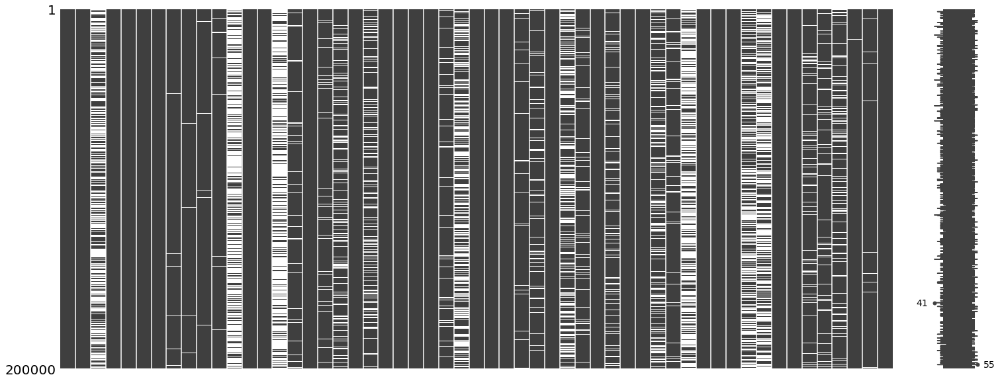

In [24]:
msno.matrix(df_test2)

In [42]:
#df_test1.drop(df_test1.loc[:, 'log_var_0': ].columns, axis = 1, inplace = True) 
df_test1.head()

,var_0,var_1,var_2,var_6,var_9,var_12,var_13,var_18,var_21,var_22,...,var_170,var_173,var_174,var_177,var_179,var_184,var_190,var_191,var_192,var_198
0,11.0656,7.7798,12.9536,5.8493,8.8100,13.9696,0.3458,15.5806,18.8064,1.5899,...,4.2603,8.4685,18.1317,10.2226,2.2926,31.3521,-2.1556,11.8495,-1.4300,15.4722
1,8.5304,1.2543,11.3047,6.0196,5.9739,14.1129,2.5667,29.1609,3.1389,5.2578,...,-0.7720,-5.6274,10.5018,8.1696,5.2110,25.1958,10.6165,8.8349,0.9403,19.1293
2,5.4827,-10.3581,10.1407,4.8950,8.3442,13.6751,3.8183,21.2181,12.3696,4.7473,...,-0.0391,-2.9787,27.4035,15.6415,4.4611,24.4721,-0.7484,10.9935,1.9803,19.8956
3,8.5374,-1.3222,12.0220,4.9397,7.4578,14.0526,13.5010,2.1273,12.5527,2.9707,...,7.2048,11.1674,14.5499,13.9407,1.1019,8.1154,9.5702,9.0766,1.6580,13.0168
4,11.7058,-0.1327,14.1295,6.8595,7.1437,14.1013,8.9672,18.0126,16.3059,6.7954,...,-1.6039,2.3640,14.0037,10.1161,6.0889,3.9829,4.2259,9.1723,1.2835,13.9260


# Implantação dos modelos

In [31]:
import lightgbm as lgb
import xgboost as xgb
import pickle
import os
import gc
gc.enable()

## Modelos

In [32]:
def fit_lgb(X_fit, y_fit, X_val, y_val, counter, lgb_path, name):
    
    model = lgb.LGBMClassifier(max_depth=5,        # It describes the maximum depth of tree
                               n_estimators=100000,
                               learning_rate=0.05,
                               colsample_bytree=0.2,
                               metric='auc', # it specifies loss for model building
                               objective='binary', # specifies the application of your model, whether it is a regression problem or classification problem
                               n_jobs=-1)
     
    model.fit(X_fit, y_fit, 
              eval_set=[(X_val, y_val)],
              verbose=0, 
              early_stopping_rounds=1000)
                  
    cv_val = model.predict_proba(X_val)[:,1]
    
    #Save LightGBM Model
    save_to = '{}{}_fold{}.txt'.format(lgb_path, name, counter+1)
    model.booster_.save_model(save_to)
    
    return cv_val

In [33]:
def fit_xgb(X_fit, y_fit, X_val, y_val, counter, xgb_path, name):
    
    model = xgb.XGBClassifier(max_depth=5,
                              n_estimators=100000,
                              learning_rate=0.05,
                              colsample_bytree=0.2,
                              objective='binary:logistic', 
                              n_jobs=-1)
     
    model.fit(X_fit, y_fit, 
              eval_set=[(X_val, y_val)], 
              verbose=0, 
              early_stopping_rounds=1000)
              
    cv_val = model.predict_proba(X_val)[:,1]
    
    #Save XGBoost Model
    save_to = '{}{}_fold{}.dat'.format(xgb_path, name, counter+1)
    pickle.dump(model, open(save_to, "wb"))
    
    return cv_val
    
    

In [34]:
def train_stage(df_path, lgb_path, xgb_path):
    
    print('Load Train Data.')
    df = df_train1.sample(frac=0.1, replace=True, random_state=123)
    print('\nShape of Train Data: {}'.format(df.shape))
    
    y_df = np.array(df['target'])                        
    df_ids = np.array(df.index)                     
    df.drop(['ID_code', 'target'], axis=1, inplace=True)
    
    lgb_cv_result = np.zeros(df.shape[0])
    xgb_cv_result = np.zeros(df.shape[0])
       
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    skf.get_n_splits(df_ids, y_df)
    
    print('\nModel Fitting...')
    for counter, ids in enumerate(skf.split(df_ids, y_df)):
        print('\nFold {}'.format(counter+1))
        X_fit, y_fit = df.values[ids[0]], y_df[ids[0]]
        X_val, y_val = df.values[ids[1]], y_df[ids[1]]
    
        print('LigthGBM')
        lgb_cv_result[ids[1]] += fit_lgb(X_fit, y_fit, X_val, y_val, counter, lgb_path, name='lgb')
        print('XGBoost')
        xgb_cv_result[ids[1]] += fit_xgb(X_fit, y_fit, X_val, y_val, counter, xgb_path, name='xgb')
                
        del X_fit, X_val, y_fit, y_val
        gc.collect()
    
    auc_lgb  = round(roc_auc_score(y_df, lgb_cv_result),4)
    auc_xgb  = round(roc_auc_score(y_df, xgb_cv_result),4)
    auc_mean = round(roc_auc_score(y_df, (lgb_cv_result+xgb_cv_result)/2), 4)
    print('\nLightGBM VAL AUC: {}'.format(auc_lgb))
    print('XGBoost  VAL AUC: {}'.format(auc_xgb))
    print('Mean XGBoost+LightGBM, VAL AUC: {}\n'.format(auc_mean))
    
    return 0
    

In [36]:
def prediction_stage(df_path, lgb_path, xgb_path):
    
    print('Load Test Data.')
    df = df_test1
    print('\nShape of Test Data: {}'.format(df.shape))
    
    df.drop(['ID_code'], axis=1, inplace=True)
    
    lgb_models = sorted(os.listdir(lgb_path))
    xgb_models = sorted(os.listdir(xgb_path))
    
    lgb_result = np.zeros(df.shape[0])
    xgb_result = np.zeros(df.shape[0])
    
    print('\nMake predictions...\n')
    
    print('With LightGBM...')
    for m_name in lgb_models:
        #Load LightGBM Model
        model = lgb.Booster(model_file='{}{}'.format(lgb_path, m_name))
        lgb_result += model.predict(df.values)
     
    print('With XGBoost...')    
    for m_name in xgb_models:
        #Load Xgboost Model
        model = pickle.load(open('{}{}'.format(xgb_path, m_name), "rb"))
        xgb_result += model.predict_proba(df.values)[:,1]
   
    lgb_result /= len(lgb_models)
    xgb_result /= len(xgb_models)
    
    submission = pd.read_csv('sample_submission.csv')
    submission['target'] = (lgb_result+xgb_result)/2
    submission.to_csv('xgb_lgb_submission.csv', index=False)
    submission['target'] = xgb_result
    submission.to_csv('xgb_starter_submission.csv', index=False)
    submission['target'] = lgb_result
    submission.to_csv('lgb_starter_submission.csv', index=False)
    
    return 0
    
    
if __name__ == '__main__':
    
    train_path = 'train.csv'
    test_path  = 'test.csv'
    
    lgb_path = 'lgb_models_stack3/'
    xgb_path = 'xgb_models_stack3/'

    #Create dir for models
    os.mkdir(lgb_path)
    os.mkdir(xgb_path)

    print('Train Stage.\n')
    train_stage(train_path, lgb_path, xgb_path)
    
    print('Prediction Stage.\n')
    prediction_stage(test_path, lgb_path, xgb_path)
    
    print('\nDone.')

Train Stage.

Load Train Data.

Shape of Train Data: (35980, 56)

Model Fitting...

Fold 1
LigthGBM
XGBoost

Fold 2
LigthGBM
XGBoost

Fold 3
LigthGBM
XGBoost

Fold 4
LigthGBM
XGBoost

Fold 5
LigthGBM
XGBoost

LightGBM VAL AUC: 0.9193
XGBoost  VAL AUC: 0.9182
Mean XGBoost+LightGBM, VAL AUC: 0.9204

Prediction Stage.

Load Test Data.

Shape of Test Data: (200000, 55)

Make predictions...

With LightGBM...
With XGBoost...

Done.
